Charles Vin & Aymeric Delefosse <span style="float:right">DAC</span>

# TME 03 - Opérateurs d'agrégation et LIME


In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


## A - Opérateurs d'agrégation

>


<div class="alert alert-block alert-warning">
L'objet de la 1ère partie de TME est de tracer les lignes de niveaux des opérateurs d'agrégation vus en cours
</div>


<div class="alert alert-block alert-info">
    Ecrire une fonction qui calcule la moyenne pondérée d'un vecteur <code>x</code> en fonction d'un vecteur <code>poids</code>
</div>


In [2]:
def weighted_mean(x, poids):
    assert len(x) == len(poids)
    return (x * poids).sum() / poids.sum()


<div class="alert alert-block alert-info">
    Ecrire une fonction qui trace les lignes de niveaux d'un opérateur, en l'appliquant à des vecteurs de taille 2.
</div>


In [3]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D


def plot_level_lines(
    operator, x_range=[0, 1], y_range=[0, 1], num_contours=10, title=None
):
    """
    Trace les lignes de niveaux d'un opérateur d'agrégation.

    :param operator: Fonction d'agrégation à tracer.
    :param x_range: Plage de valeurs pour la première composante du vecteur, [0, 1] par défaut.
    :param y_range: Plage de valeurs pour la deuxième composante du vecteur, [0, 1] par défaut.
    :param num_contours: Nombre de contours à tracer, 10 par défaut.
    """
    x_values = np.linspace(x_range[0], x_range[1], 100)
    y_values = np.linspace(y_range[0], y_range[1], 100)
    X, Y = np.meshgrid(x_values, y_values)
    Z = np.zeros_like(X)

    for i in range(X.shape[0]):
        for j in range(X.shape[1]):
            Z[i, j] = operator([X[i, j], Y[i, j]])

    fig = plt.figure(figsize=(12, 5))
    if title:
        fig.suptitle(title)
    # Lignes de niveaux en 2D
    plt.subplot(1, 2, 1)
    plt.contourf(X, Y, Z, levels=num_contours)
    plt.colorbar(label="Function Value")
    plt.xlabel("$u$")
    plt.ylabel("$v$")
    plt.title(f"2D Contour Plot")

    # Lignes de niveaux en 3D
    plt.subplot(1, 2, 2, projection="3d")
    ax = plt.gca()
    ax.plot_surface(X, Y, Z, cmap="viridis")
    ax.set_xlabel("$u$")
    ax.set_ylabel("$v$")
    ax.set_zlabel("Function Value")
    plt.title("3D Surface Plot")

    plt.tight_layout()
    plt.show()


<div class="alert alert-block alert-info">
    Ecrire une fonction qui calcule un OWA d'un vecteur <code>x</code> en fonction d'un vecteur <code>poids</code>
</div>


In [4]:
def owa(x, poids):
    assert len(x) == len(poids)
    return np.dot(np.sort(x), poids)


<div class="alert alert-block alert-info">
    Visualiser les lignes de niveaux de différentes configurations des moyennes pondérées et des OWA pour différents vecteurs de poids.    
</div>


### OWA


Pour obtenir des plots 3D interactif, exécutez le notebook en décommentant la ligne suivante


In [5]:
# %matplotlib widget


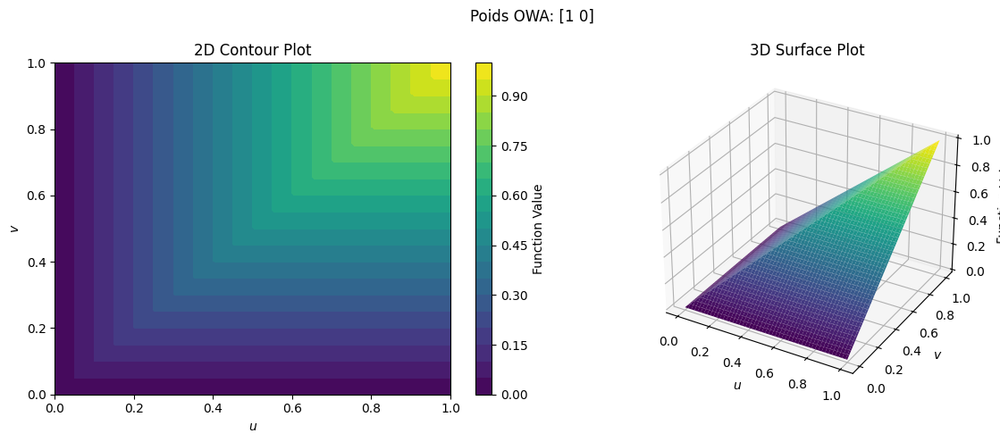

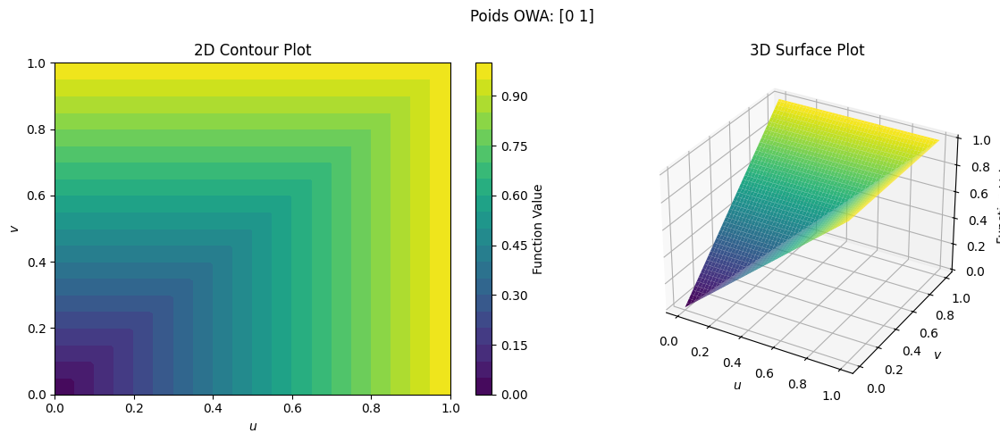

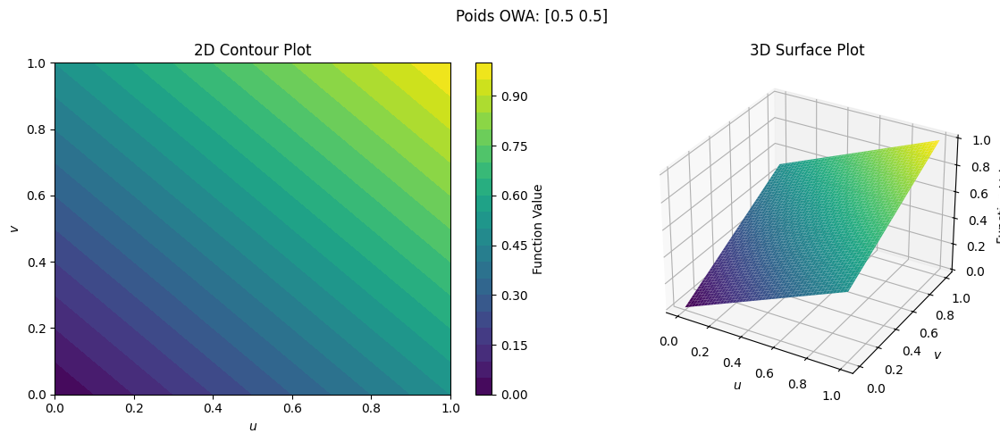

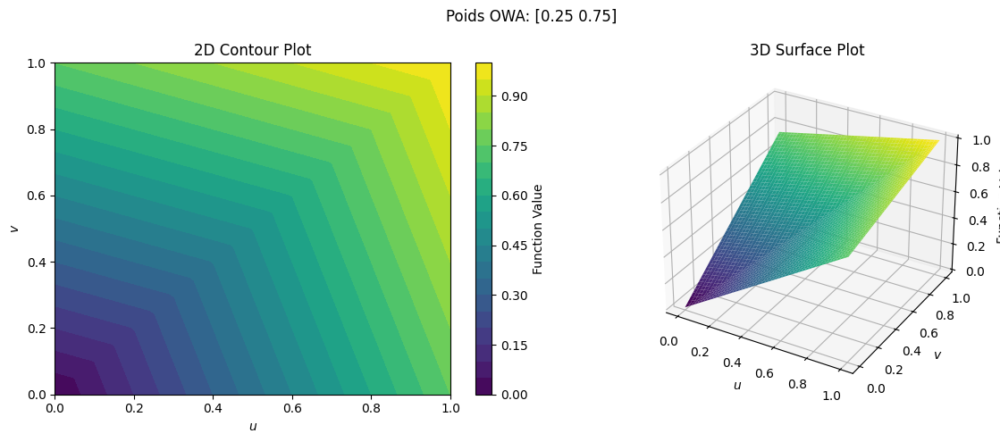

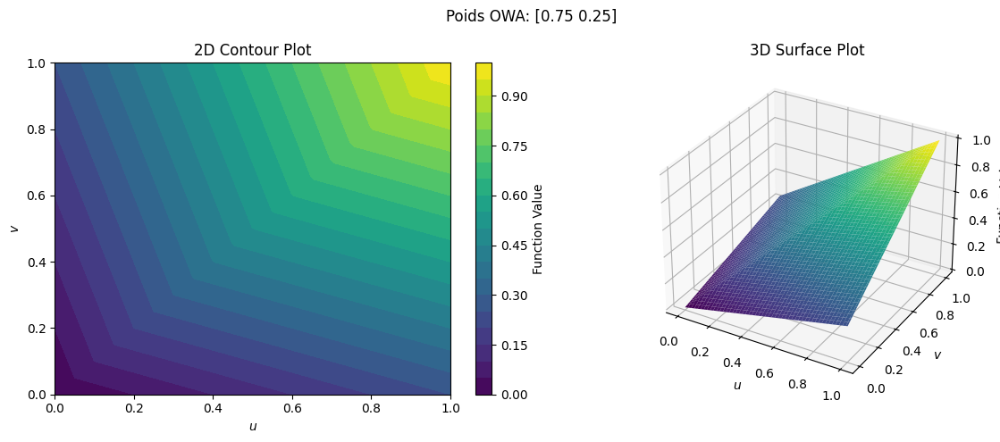

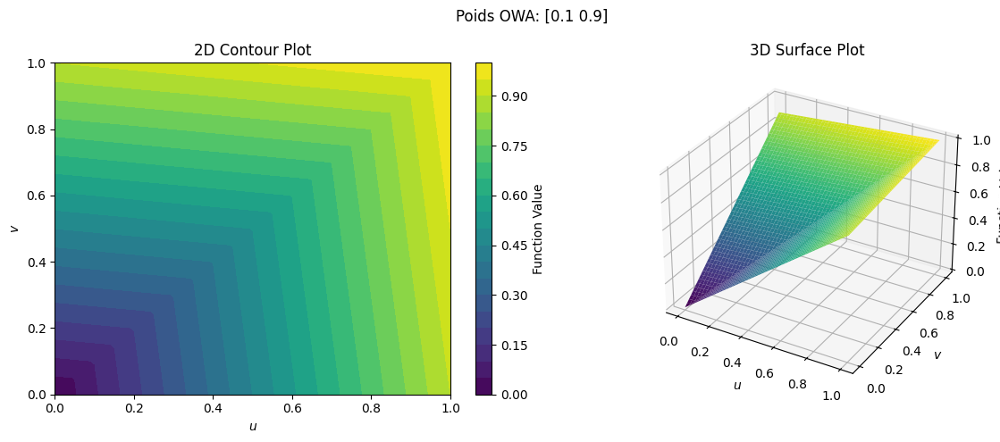

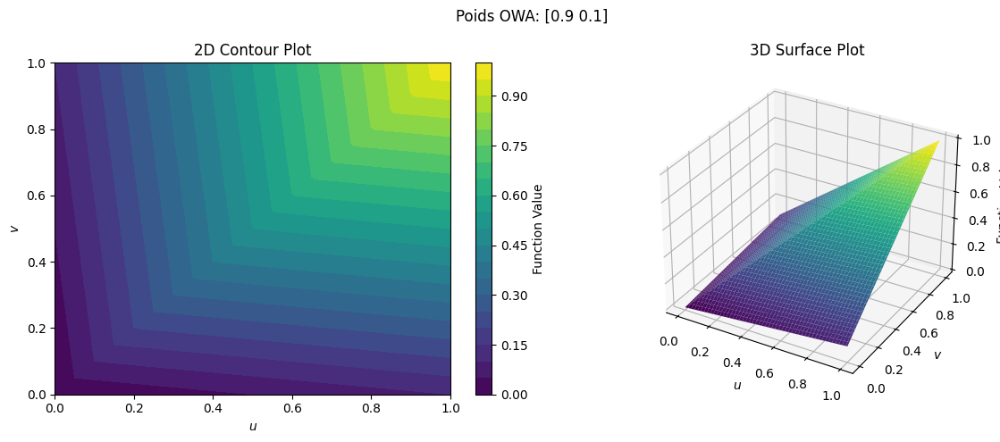

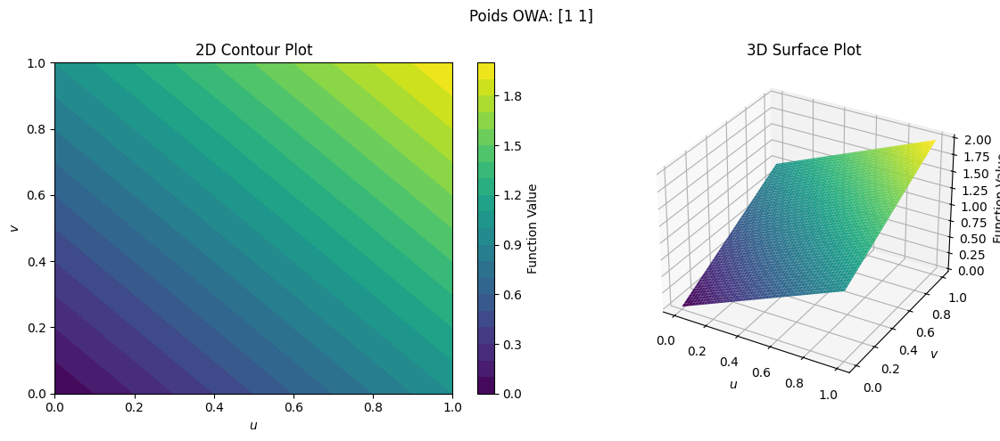

In [6]:
liste_poids = [
    np.array([1, 0]),
    np.array([0, 1]),
    np.array([0.5, 0.5]),
    np.array([0.25, 0.75]),
    np.array([0.75, 0.25]),
    np.array([0.1, 0.9]),
    np.array([0.9, 0.1]),
    np.array([1, 1]),
]

for poids in liste_poids:
    plot_level_lines(
        lambda x: owa(x, poids), num_contours=20, title=f"Poids OWA: {poids}"
    )


### Moyenne pondérée


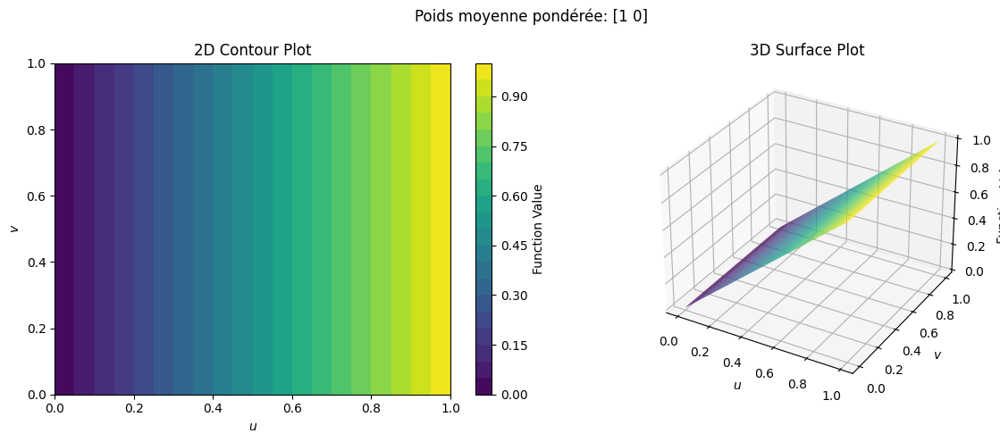

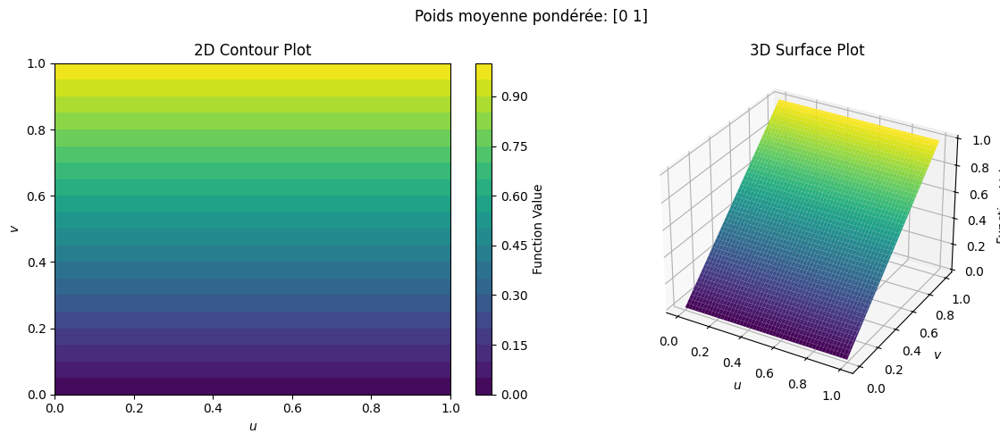

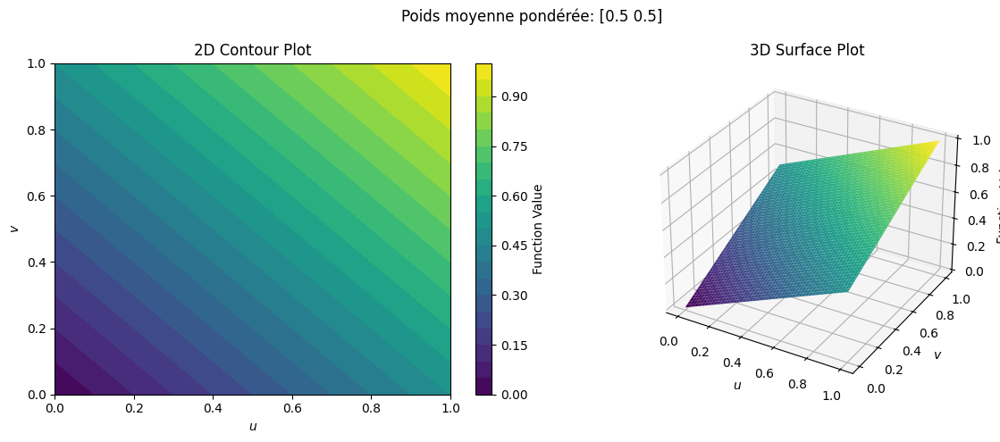

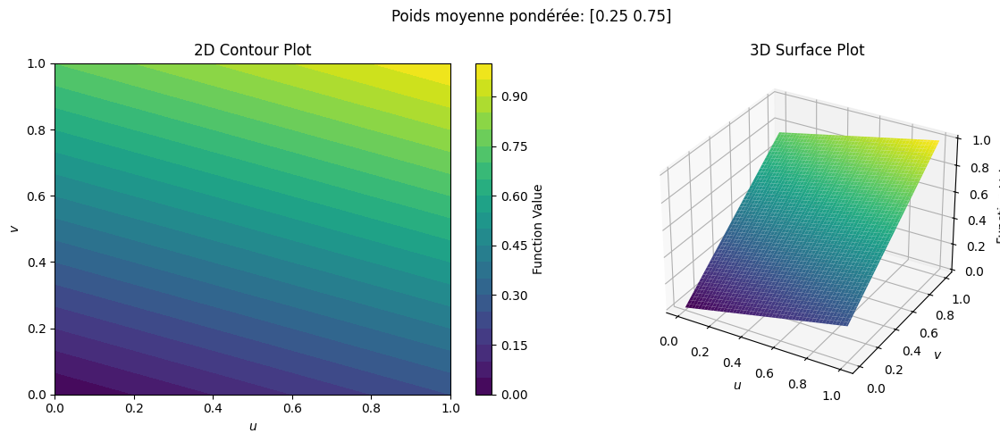

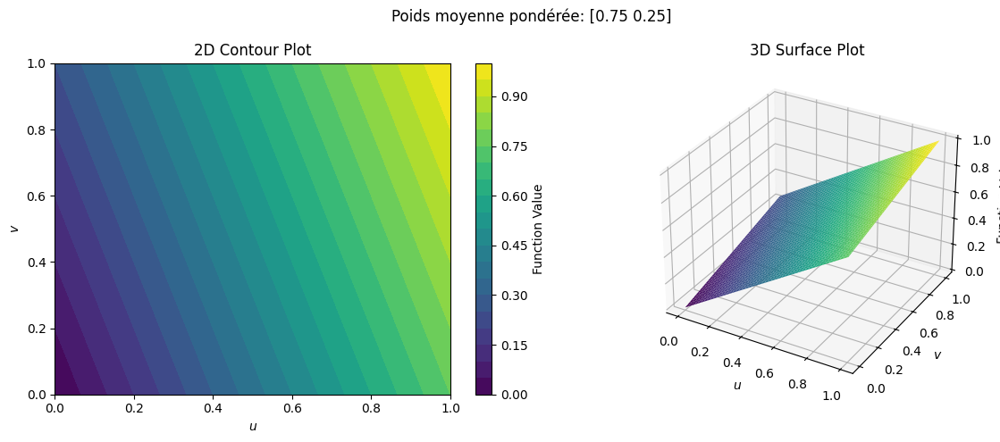

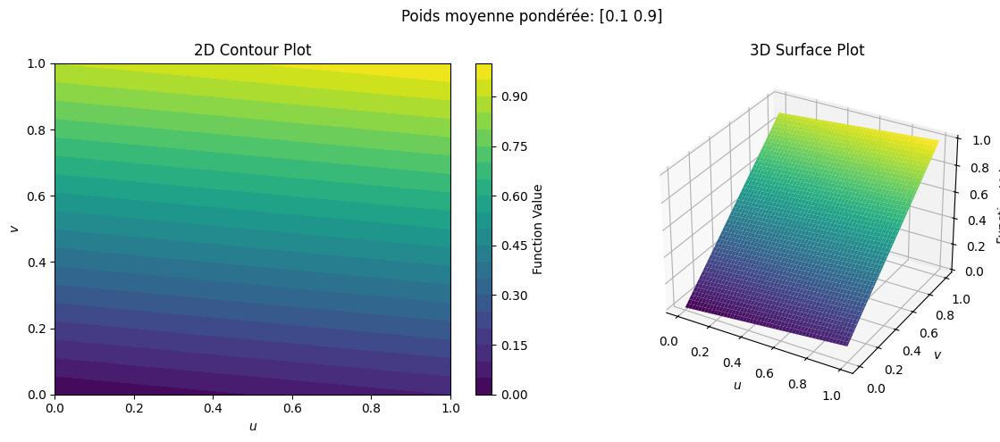

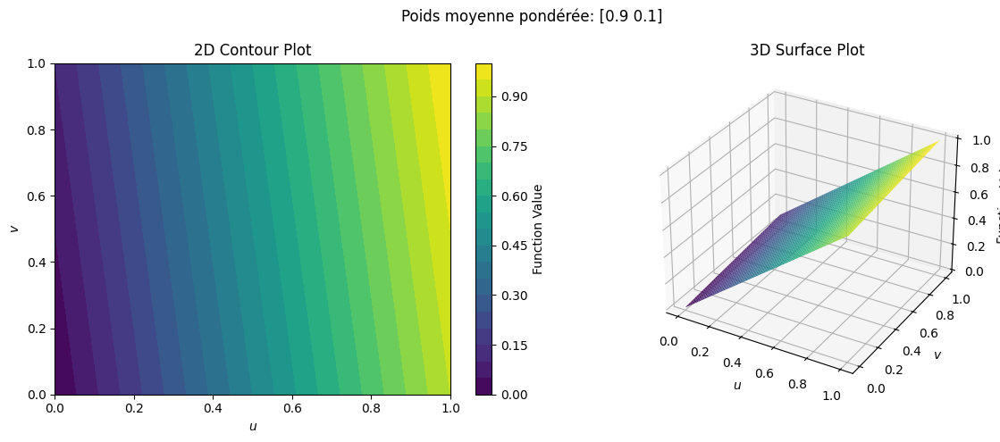

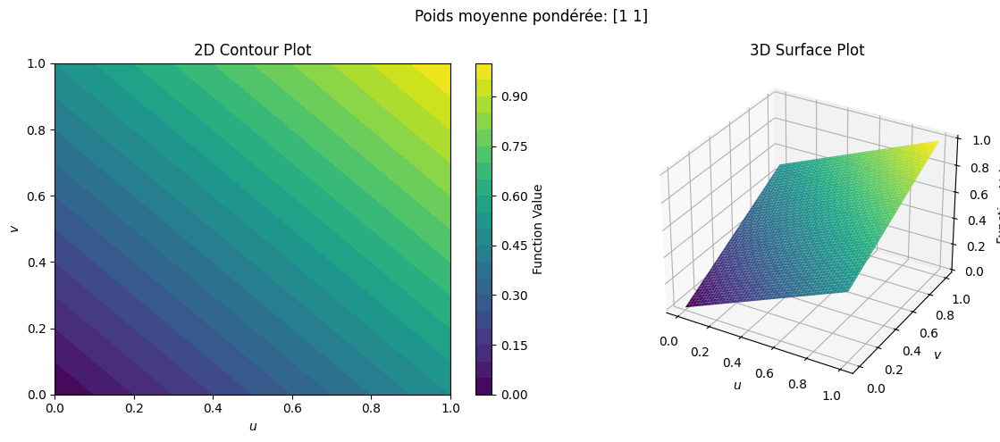

In [7]:
for poids in liste_poids:
    plot_level_lines(
        lambda x: weighted_mean(x, poids),
        num_contours=20,
        title=f"Poids moyenne pondérée: {poids}",
    )


<div class="alert alert-block alert-info">
    Visualiser aussi les lignes de niveaux des opérateurs conjonctifs et disjonctifs vus en cours, ainsi que l'opérateur à comportement variable (intégrale de Gödel), après avoir défini les fonctions permettant de calculer ces opérateurs.
</div>


In [8]:
class OperateurConjonctif:
    def min(vector):
        return np.minimum(vector[0], vector[1])

    def max(vector):
        return np.maximum(vector[0] + vector[1] - 1, 0)

    def product(vector):
        return vector[0] * vector[1]


class OperateurDisjonctif:
    def min(vector):
        return np.minimum(vector[0] + vector[1], 1)

    def max(vector):
        return np.maximum(vector[0], vector[1])

    def product(vector):
        return vector[0] + vector[1] - vector[0] * vector[1]


class OperateurCompromis:
    def moyenne(vector):
        return vector.mean()


### Opérateurs conjonctifs


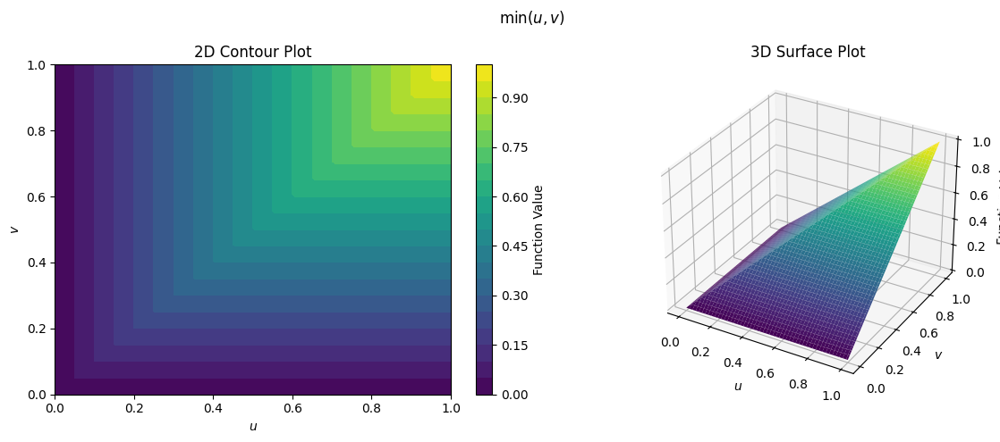

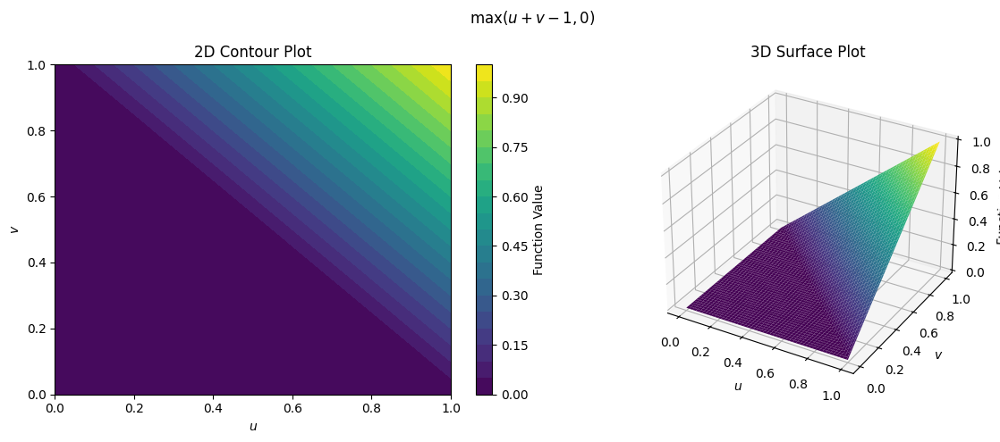

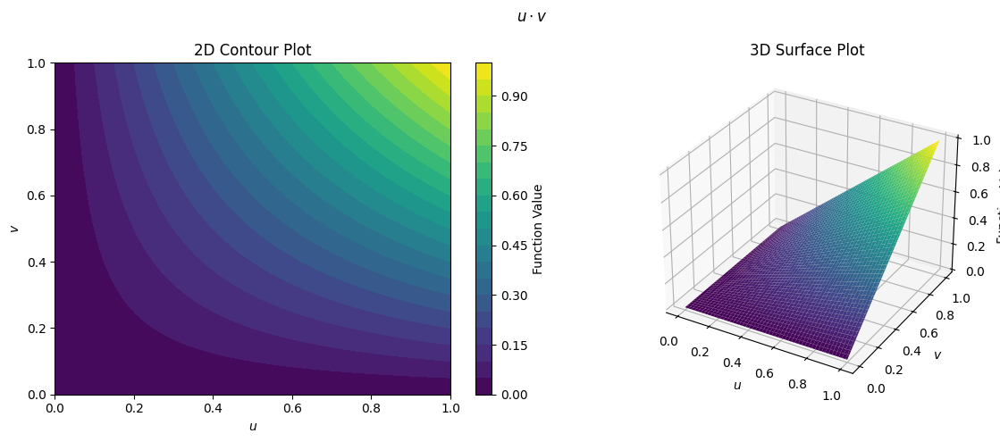

In [9]:
plot_level_lines(OperateurConjonctif.min, num_contours=20, title="$\min(u,v)$")
plot_level_lines(OperateurConjonctif.max, num_contours=20, title="$\max(u + v - 1, 0)$")
plot_level_lines(OperateurConjonctif.product, num_contours=20, title="$u \cdot v$")


### Opérateurs disjonctifs


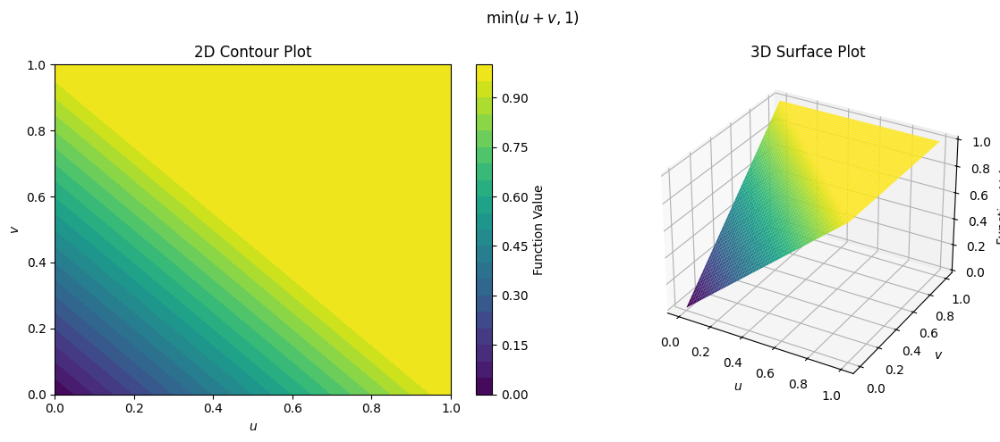

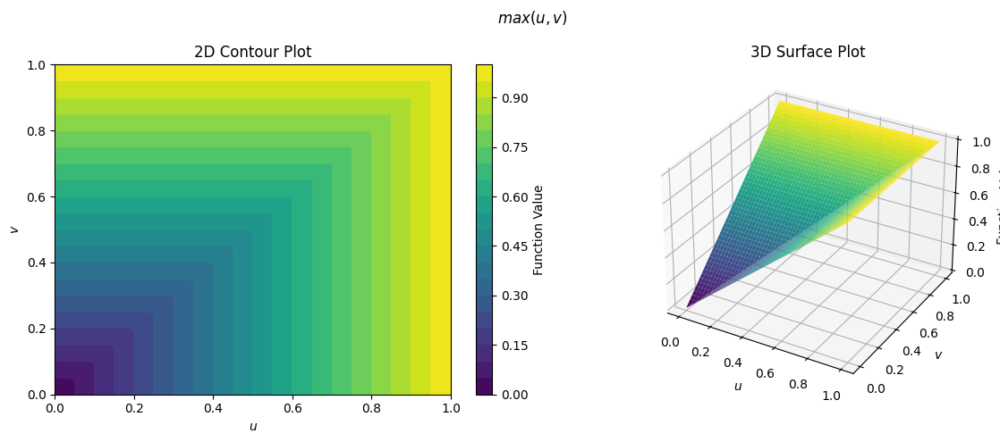

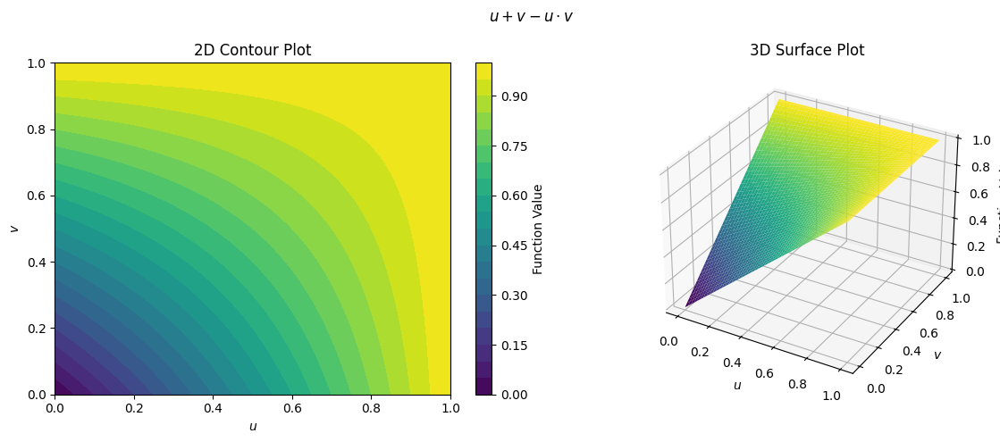

In [10]:
plot_level_lines(OperateurDisjonctif.min, num_contours=20, title="$\min(u + v, 1)$")
plot_level_lines(OperateurDisjonctif.max, num_contours=20, title="$max(u, v)$")
plot_level_lines(
    OperateurDisjonctif.product, num_contours=20, title="$u + v - u \cdot v$"
)


### Opérateurs de compromis (moyenne)


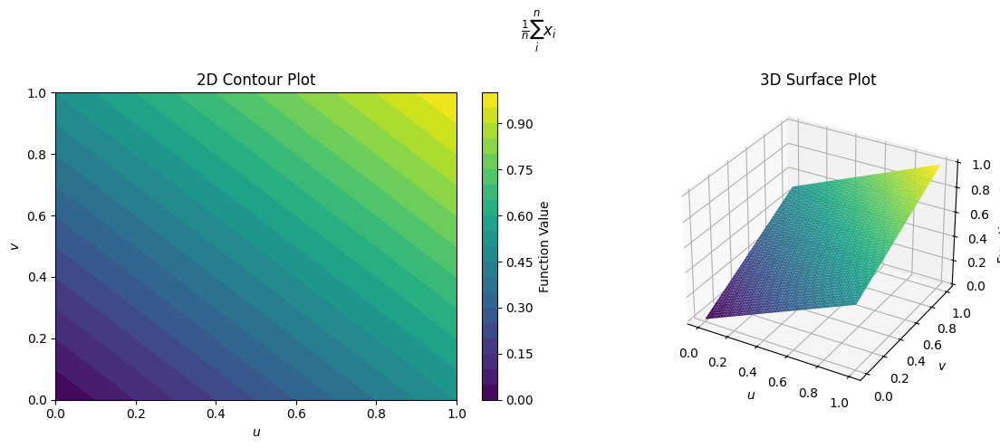

In [11]:
plot_level_lines(np.mean, num_contours=20, title="$\\frac{1}{n} \sum_i^n x_i$")


### Intégrales de Gödel (opérateur à attitude variable)


In [12]:
import numpy as np


def godel_integral(vector, poids):
    """
    Calcule l'opérateur intégral de Gödel pour un vecteur d'entrée x et un vecteur de poids w.

    :param vector: Vecteur d'entrée.
    :param weights: Vecteur de poids.
    :return: Résultat de l'opérateur des intégrales de Gödel.
    """
    assert len(vector) == len(poids)
    u, v = vector[0], vector[1]
    alpha, beta = poids[0], poids[1]

    if u <= 1 - alpha and v <= 1 - beta:
        return np.minimum(u, v)
    elif u > 1 - alpha and v > 1 - beta:
        return np.maximum(u, v)
    elif u > 1 - alpha and v <= 1 - beta:
        return u
    elif u <= 1 and v > 1 - beta:
        return v


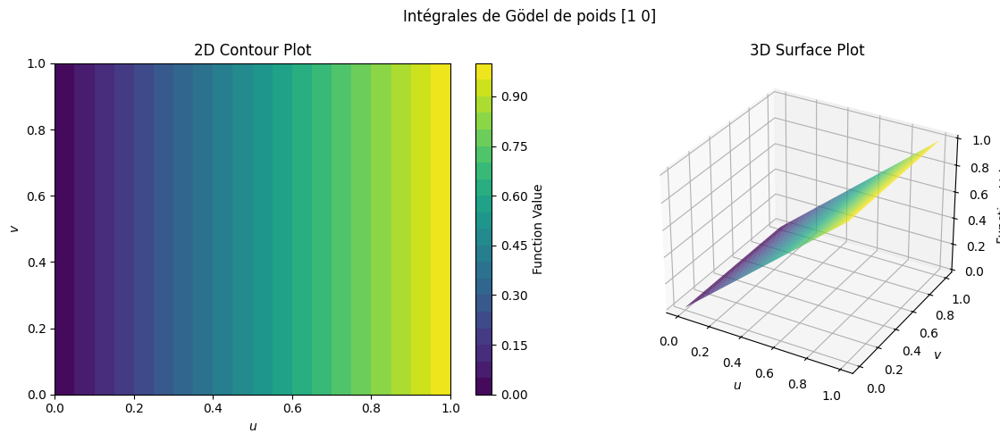

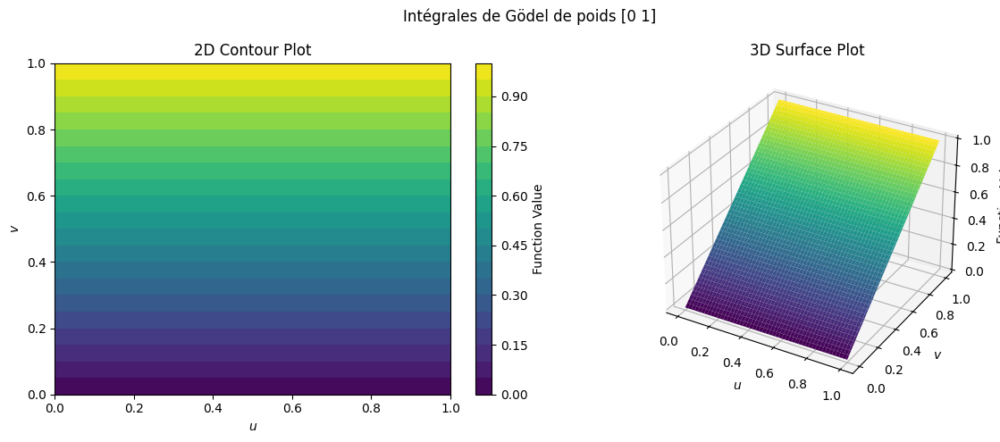

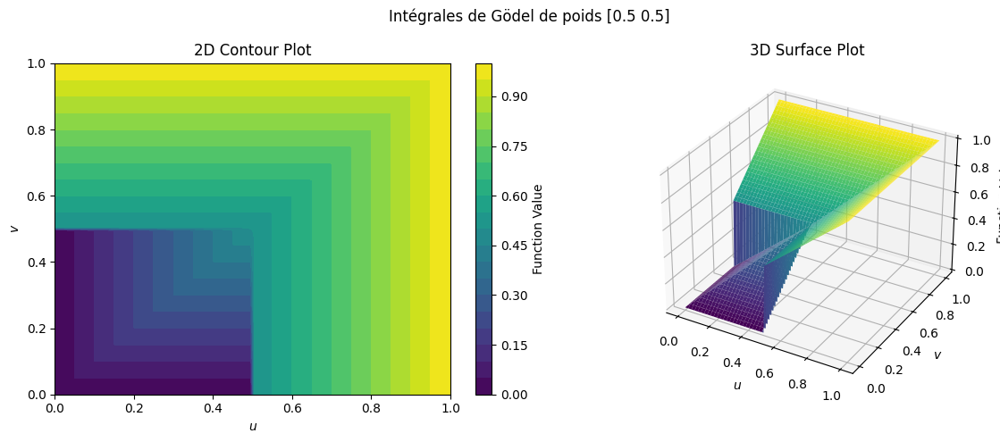

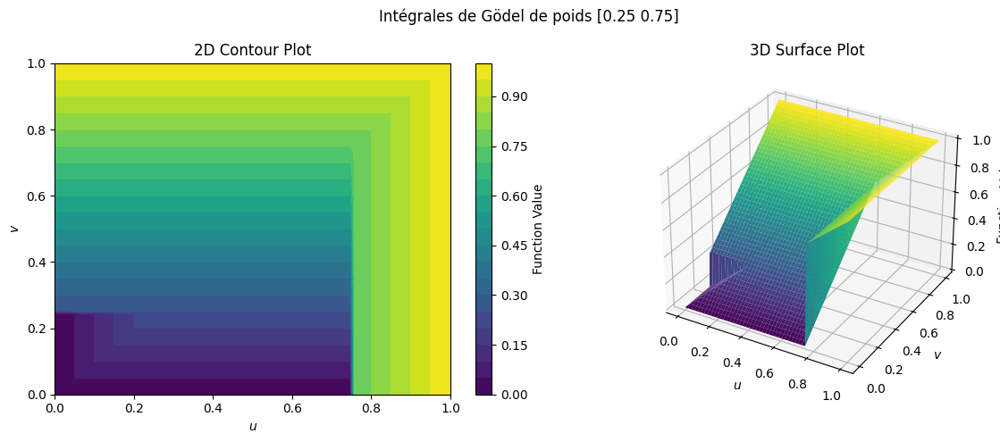

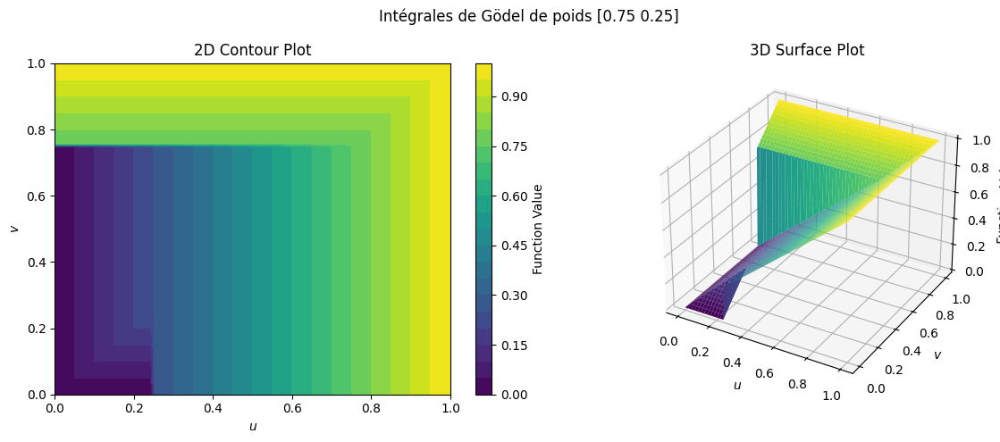

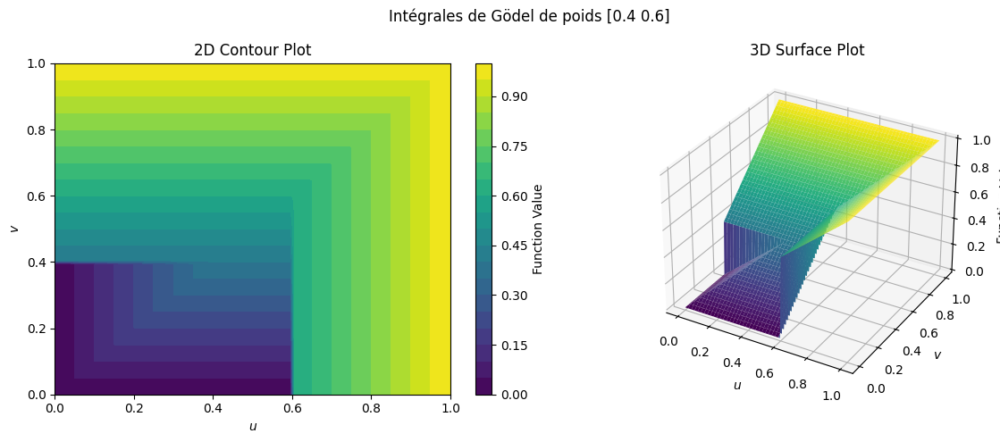

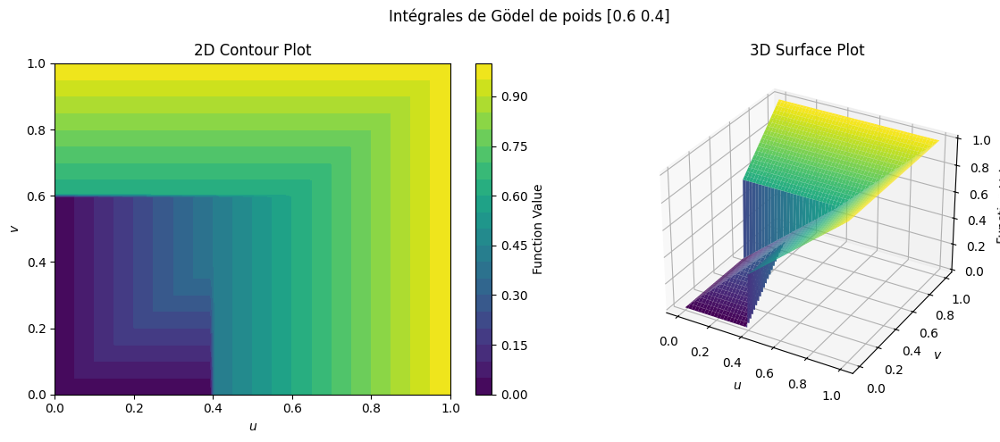

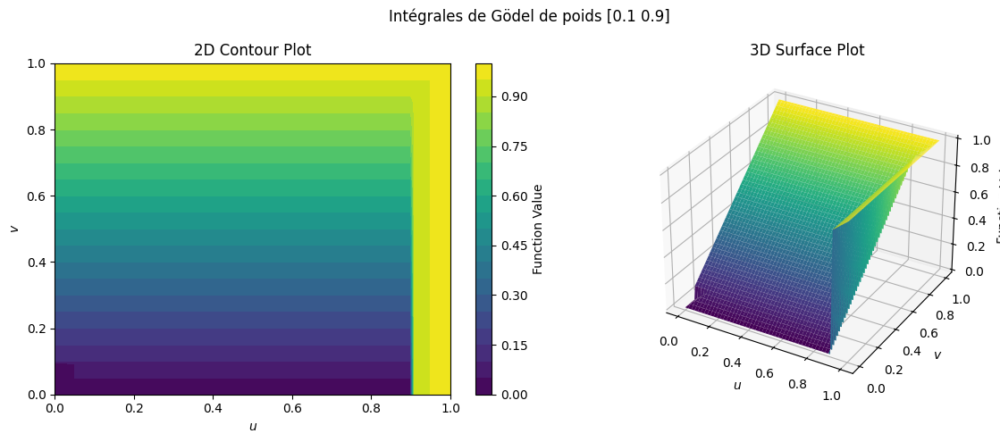

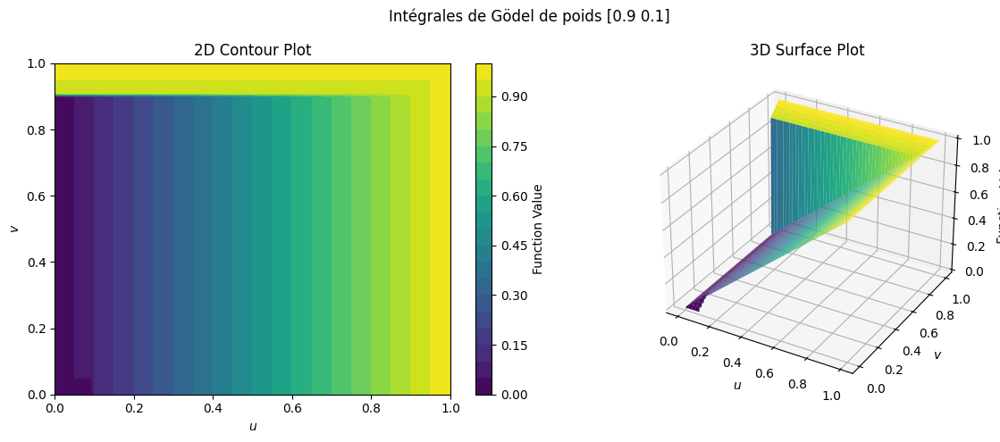

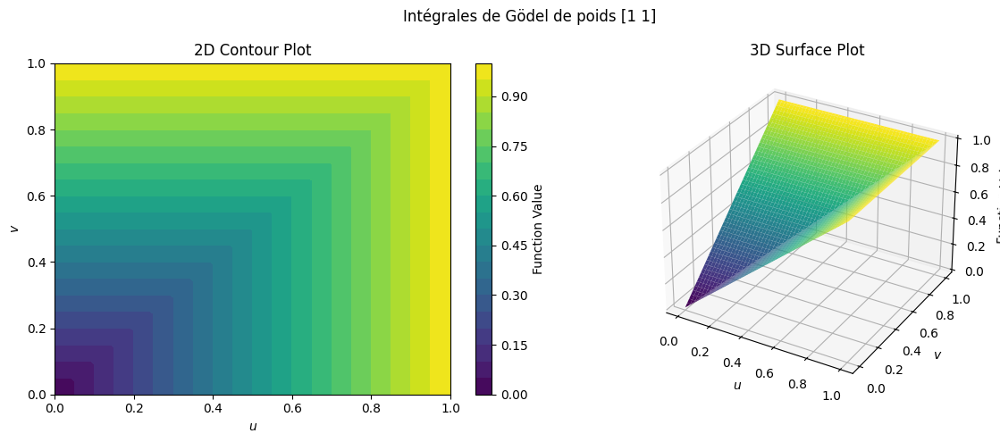

In [13]:
liste_poids = [
    np.array([1, 0]),
    np.array([0, 1]),
    np.array([0.5, 0.5]),
    np.array([0.25, 0.75]),
    np.array([0.75, 0.25]),
    np.array([0.4, 0.6]),
    np.array([0.6, 0.4]),
    np.array([0.1, 0.9]),
    np.array([0.9, 0.1]),
    np.array([1, 1]),
]

for poids in liste_poids:
    plot_level_lines(
        lambda x: godel_integral(x, poids),
        num_contours=20,
        title=f"Intégrales de Gödel de poids {poids} ",
    )


<div class="alert alert-block alert-info">
    Ecrire une fonction qui calcule l'intégrale de Choquet d'un vecteur <code>x</code> en fonction d'une capacité <code>mu</code>.<br>
    La fonction ne doit pas imposer de restriction au nombre de composantes de <code>x</code>, sa documentation doit expliciter la représentation choisie pour <code>mu</code>, la fonction doit inclure une vérification que <code>mu</code> satisfait les propriétés d'une capacité.
    
</div>


- $ \sigma $ représente les indices de $x$ **triés** ;
- Les $ A\_{\sigma(i)} $ sont représentés par des `frozenset` d'indice de $x$ **triés** ;
- $\mu$ doit être défini de manière assez précise : il prend la forme d'un dictionnaire avec pour clé un $ A*{\sigma(i)} $ qui est donc un `frozenset()` dans l'implémentation. La valeur associée à cette clé est la valeur de $ \mu(A*{\sigma(i)}) $. Chaque valeur $i$ dans le `frozenset()` est associée à la valeur d'indice $i$ du $x$ trié ($=\sigma (i)$).

Pour créer le dictionnaire $\mu$ :

1. Définir un $x$ ;
2. Trier $x$ ;
3. Choisir les indices $\sigma(i)$ du $x$ trié pour obtenir la clé du dictionnaire $\mu$, et attribuer la valeur $\mu(A_{\sigma(i)})$ souhaité.


In [14]:
def check_mu(mu, x):
    """Vérifie si la fonction de capacité `mu` donnée satisfait les propriétés d'une
    capacité de Choquet, à savoir :
    * \mu(A_\sigma{1}) = 1
    * Monotonicité

    :param dict mu: Un dictionnaire représentant la capacité de Choquet.
    :param numpy.ndarray x: Le vecteur d'entrée.
    :raises KeyError: Si les conditions ne sont pas remplies.
    :return bool: True si les conditions sont satisfaites.
    """
    sig = np.argsort(x)
    assert (
        mu[frozenset(sig)] == 1
    ), "Problème de condition à la borne supérieure pour mu"
    assert mu[frozenset([])] == 0, "Problème de condition à la borne inférieure pour mu"

    # Monotonicité
    d = (
        {}
    )  # clé : cardinal, valeur : valeur maximale trouvée dans mu pour ce cardinal d'A_sigma(i)
    for key in mu.keys():
        card_A = len(key)
        tmp = d.get(card_A, 0)
        # Si la valeur de mu est plus grande que la valeur stockée actuellement pour ce cardinal, on la remplace
        if tmp < mu[key]:
            tmp = mu[key]
        d[card_A] = tmp

    # Vérification de la monotonicité pour chaque cardinal
    try:
        tmp = 0
        for i in range(1, len(sig)):
            assert d[i - 1] < d[i], "Problème de monotonicité pour mu"
    except KeyError:
        raise KeyError("Il manque des valeurs dans mu")
    return True


def choquet(x, mu):
    """Calcule l'intégrale de Choquet d'un vecteur `x` par rapport à la capacité `mu`
    donnée.

    :param numpy.ndarray x: Le vecteur d'entrée.
    :param dict mu: Un dictionnaire représentant la capacité de Choquet. Les clés sont
    des `frozensets` d'indices à partir d'un vecteur trié `x`
    (A_{\sigma(i)} = set([\sigma(i), ..., \sigma(n)]), et les valeurs sont les valeurs de
    capacité correspondantes (\mu(A_{\sigma(i)})).
    :return float: La valeur de l'intégrale de Choquet.
    """
    assert check_mu(mu, x)

    x_sorted = np.argsort(x)
    integral_sum = 0
    for i in range(len(x)):
        key_i = frozenset(x_sorted[i:])
        key_ip1 = frozenset(x_sorted[i + 1 :])
        integral_sum += (mu[frozenset(key_i)] - mu[frozenset(key_ip1)]) * x[x_sorted[i]]
    return integral_sum


Test avec des $\mu$ ne vérifiant pas les conditions d'une capacité :


In [15]:
mu = {
    frozenset([0, 1]): 0.95,
    frozenset([0]): 0.5,
    frozenset([1]): 0.9,
    frozenset([]): 0,
}  # /!\
try:
    check_mu(mu, np.array([1, 2]))
except AssertionError as error:
    print(error)


Problème de condition à la borne supérieure pour mu


In [16]:
mu = {
    frozenset([0, 1]): 1,
    frozenset([0]): 0.5,
    frozenset([1]): 0.9,
    frozenset([]): 0.05,
}  # /!\
try:
    check_mu(mu, np.array([1, 2]))
except AssertionError as error:
    print(error)


Problème de condition à la borne inférieure pour mu


In [17]:
mu = {
    frozenset([0, 1, 2]): 1,
    frozenset([0, 1]): 0.3,
    frozenset([0, 2]): 0.2,
    frozenset([1, 2]): 0.2,
    frozenset([0]): 0.15,
    frozenset([1]): 0.1,
    frozenset([2]): 0.1,
    frozenset([]): 0,
}
check_mu(mu, np.array([1, 2, 3]))


True

In [18]:
mu = {
    frozenset([0, 1, 2]): 1,
    frozenset([0, 1]): 0.3,
    frozenset([0, 2]): 0.2,
    frozenset([1, 2]): 0.2,
    frozenset([0]): 0.4,  # /!\
    frozenset([1]): 0.1,
    frozenset([2]): 0.1,
    frozenset([]): 0,
}
try:
    check_mu(mu, np.array([1, 2, 3]))
except AssertionError as error:
    print(error)


Problème de monotonicité pour mu


Test de l'intégrale de Choquet avec l'exemple du cours


In [19]:
# Exemple du cours
vector = np.array([1, 1])

mu = {frozenset([0, 1]): 1, frozenset([0]): 0.5, frozenset([1]): 0.9, frozenset([]): 0}

"""
x_1 < x_2
=> 0.1 x_1  + 0.9 x_2
"""
print(choquet(vector, mu))
assert round(choquet(vector, mu), 5) == round(
    0.1 * vector[0] + 0.9 * vector[1], 5
)  # round nécéssaire à cause des 1.90000000000001


1.0


In [20]:
# Exemple du cours
vector = np.array([1, 2])
mu = {frozenset([0, 1]): 1, frozenset([0]): 0.5, frozenset([1]): 0.9, frozenset([]): 0}

"""
x_1 < x_2
=> 0.1 x_1  + 0.9 x_2
"""
print(choquet(vector, mu))
assert round(choquet(vector, mu), 5) == round(
    0.1 * vector[0] + 0.9 * vector[1], 5
)  # round nécéssaire à cause des 1.90000000000001


1.9


In [21]:
# Exemple du cours
vector = np.array([2, 1])
# x trié : [1, 2]
mu = {
    frozenset([0, 1]): 1,
    frozenset([0]): 0.5,  # on associe {1} à 0.5
    frozenset([1]): 0.9,  # on associe {2} à 0.9
    frozenset([]): 0,
}

"""
x_1 > x_2
=> 0.5 x_1  + 0.5 x_2
"""
print(choquet(vector, mu))
assert round(choquet(vector, mu), 5) == round(
    0.5 * vector[0] + 0.5 * vector[1], 5
)  # round nécéssaire


1.5


<div class="alert alert-block alert-info">
    Visualiser les lignes de niveaux de différentes intégrales de Choquet, pour différentes valeurs des paramètres. 
</div>


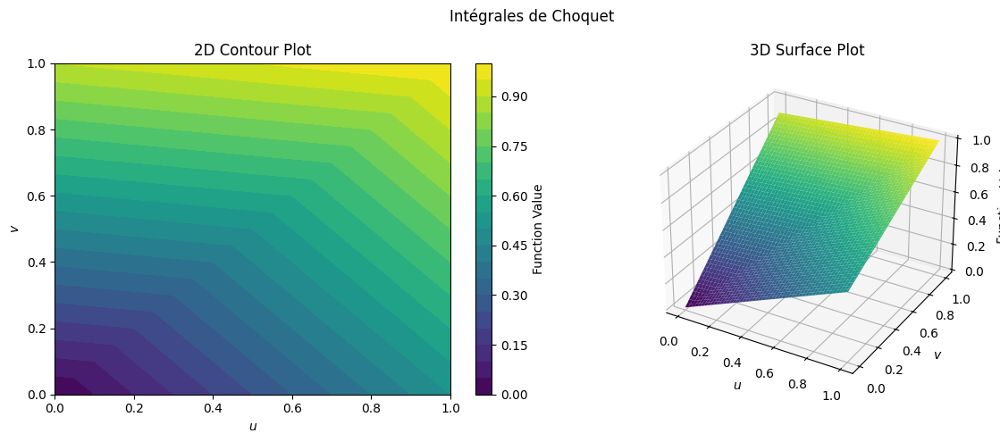

In [22]:
plot_level_lines(
    lambda x: choquet(x, mu), num_contours=20, title="Intégrales de Choquet"
)


<div class="alert alert-block alert-info">
    Commenter les résultats obtenus. 
</div>


C'est très joli, cela nous rend très heureux.


## B - LIME


<div class="alert alert-block alert-warning">
L'objet de cette 2ème partie de TME est de tester l'algorithme LIME sur une tâche de classification assez simple.
</div>


## 1 - Préparation du dataset

<div class="alert alert-block alert-warning">
    Nous allons utiliser les datasets <code>half-moons</code>, que vous savez manipuler, pour permettre la visualisation des résultats et <a href="https://archive.ics.uci.edu/ml/datasets/Breast+Cancer+Wisconsin+(Diagnostic)">UCI ML Breast Cancer Wisconsin (Diagnostic)</a> qui comporte plus d'attributs.
</div>


<div class="alert alert-block alert-info">
    Tout d'abord, exécuter le bloc ci-dessous pour importer la bibliothèque <code>datasets</code> de <code>sklearn</code>.
</div>


In [23]:
from sklearn import datasets


<div class="alert alert-block alert-info">
    Exécuter le bloc suivant pour charger les données <code>breast_cancer</code>.
 </div>


In [24]:
breast_cancer = datasets.load_breast_cancer()


<div class = "alert alert-block alert-info">
    Q1.1 - Visualiser le contenu de la variable <code>breast_cancer</code>.
</div>


In [25]:
breast_cancer.feature_names


array(['mean radius', 'mean texture', 'mean perimeter', 'mean area',
       'mean smoothness', 'mean compactness', 'mean concavity',
       'mean concave points', 'mean symmetry', 'mean fractal dimension',
       'radius error', 'texture error', 'perimeter error', 'area error',
       'smoothness error', 'compactness error', 'concavity error',
       'concave points error', 'symmetry error',
       'fractal dimension error', 'worst radius', 'worst texture',
       'worst perimeter', 'worst area', 'worst smoothness',
       'worst compactness', 'worst concavity', 'worst concave points',
       'worst symmetry', 'worst fractal dimension'], dtype='<U23')

<div class = "alert alert-block alert-info">
    Q1.2 - Définir les variables <code>X_train, X_test, y_train, y_test</code> avec <code>train_test_split</code> où vous utiliserez 25% des données pour le test.
</div>


In [26]:
from sklearn.model_selection import train_test_split


X_train, X_test, y_train, y_test = train_test_split(
    breast_cancer.data, breast_cancer.target, test_size=0.25, random_state=42
)


<div class = "alert alert-block alert-info">
    Q1.3 - Définir la variable <code>feature_names</code> contenant la liste des caractéristiques dans ce dataset ainsi que les noms de classes dans la variable <code>target_names</code>.
</div>


In [27]:
feature_names = breast_cancer.feature_names
target_names = breast_cancer.target_names


In [28]:
feature_names


array(['mean radius', 'mean texture', 'mean perimeter', 'mean area',
       'mean smoothness', 'mean compactness', 'mean concavity',
       'mean concave points', 'mean symmetry', 'mean fractal dimension',
       'radius error', 'texture error', 'perimeter error', 'area error',
       'smoothness error', 'compactness error', 'concavity error',
       'concave points error', 'symmetry error',
       'fractal dimension error', 'worst radius', 'worst texture',
       'worst perimeter', 'worst area', 'worst smoothness',
       'worst compactness', 'worst concavity', 'worst concave points',
       'worst symmetry', 'worst fractal dimension'], dtype='<U23')

In [29]:
target_names


array(['malignant', 'benign'], dtype='<U9')

## 2 - Apprentissage d'un modèle linéaire

<div class="alert alert-block alert-warning">
Nous allons apprendre la tâche de classification en utilisant un modèle de régression logistique.
</div>


<div class = "alert alert-block alert-info">
    Q2.1 - Apprendre un modèle <code>logreg</code> de régression logistique sur les données.
</div>


In [30]:
from sklearn.linear_model import LogisticRegression

logreg = LogisticRegression()
logreg.fit(X_train, y_train)


LogisticRegression()

<div class = "alert alert-block alert-info">
    Q2.2 - Dans <code>y_pred</code>, calculer les prédictions sur les données de test.
</div>


In [31]:
y_pred = logreg.predict(X_test)


<div class = "alert alert-block alert-info">
    Q2.3 - Avec <code>confusion_matrix</code>, donner la matrice de confusion sur les données de test.
</div>


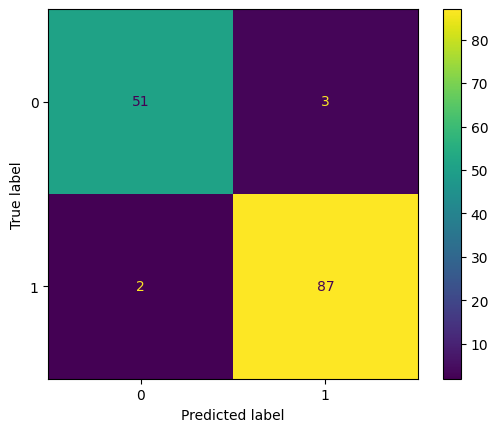

In [32]:
from sklearn.metrics import ConfusionMatrixDisplay

ConfusionMatrixDisplay.from_estimator(logreg, X_test, y_test)


<div class = "alert alert-block alert-info">
    Q2.3 - Avec <code>f1_score</code>, calculer le score f1.
</div>


In [33]:
from sklearn.metrics import f1_score

f1_score(y_test, y_pred, average="binary")


0.9720670391061451

<div class = "alert alert-block alert-info">
    Q2.4 - En utilisant les labels des caractéristiques du dataset, dessiner un diagramme en barre de l'importance de chaque caractéristique apprise par la régression logistique.
</div>


worst radius               1.112414
mean radius                1.069448
texture error              0.495507
mean texture               0.364441
mean perimeter             0.097344
perimeter error            0.068038
radius error               0.034526
smoothness error          -0.003724
fractal dimension error   -0.003896
mean area                 -0.004517
mean fractal dimension    -0.012611
symmetry error            -0.014178
concave points error      -0.014820
worst area                -0.023355
mean smoothness           -0.040326
compactness error         -0.041048
concavity error           -0.055340
worst fractal dimension   -0.055647
mean symmetry             -0.060488
worst smoothness          -0.073041
area error                -0.102093
worst perimeter           -0.108078
mean concave points       -0.115387
mean compactness          -0.194597
worst symmetry            -0.195083
worst concave points      -0.213265
mean concavity            -0.269052
worst texture             -0

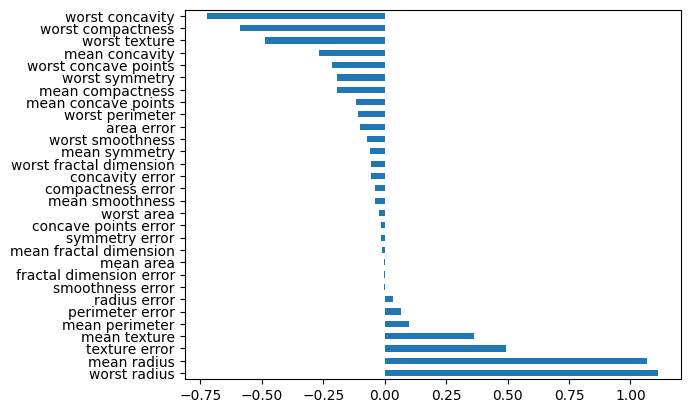

In [34]:
import pandas as pd

coefs = logreg.coef_[0]
pd.Series(coefs, index=feature_names).nlargest(coefs.size).plot(kind="barh")
pd.Series(coefs, index=feature_names).nlargest(coefs.size)


<div class = "alert alert-block alert-info">
    Q2.5 - De la même manière, donner les importances du premier exemple de la base de test.
</div>


<Axes: >

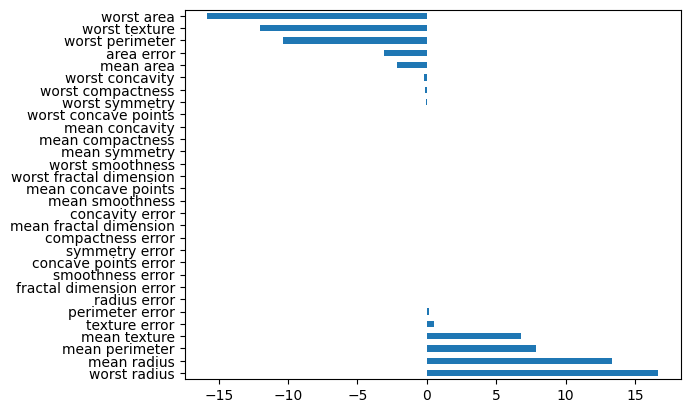

In [35]:
pd.Series(coefs * X_test[0], index=feature_names).nlargest(coefs.size).plot(kind="barh")


## 3 - Explication avec LIME

<div class="alert alert-block alert-warning">
Nous allons étudier une explication donnée par LIME.
</div>


<div class = "alert alert-block alert-info">
    Q3.1 - Exécuter le bloc ci-dessous pour obtenir une explication sur le premier exemple de la base de test. Commentez.
</div>


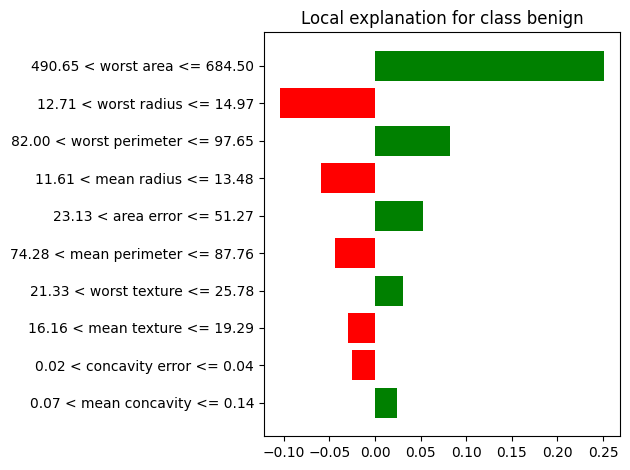

In [36]:
from lime.lime_tabular import LimeTabularExplainer

explainer = LimeTabularExplainer(
    X_test,
    feature_names=feature_names,
    class_names=target_names,
    categorical_features=[],
    mode="classification",
)

exp = explainer.explain_instance(X_test[0], logreg.predict_proba, num_features=10)
exp.as_pyplot_figure()
plt.tight_layout()


In [37]:
exp.show_in_notebook()


**Commentaire** : Le premier exemple de la base de test a été classifié tel que _bénin_ (1).

LIME soulève l'observation suivante : ce n'est pas seulement la valeur de cette feature en elle-même qui est déterminante pour la classification, mais aussi la plage ou l'intervalle dans lequel elle se trouve.

Cela suggère que la classification peut être influencée par des seuils ou des plages spécifiques pour certaines features plutôt que par des valeurs absolues. Il y a donc une sensibilité du modèle à des regroupements de valeurs ou à des relations non linéaires entre les features et les classes de classification.


<div class = "alert alert-block alert-info">
    Q3.2 - Comparer avec l'exemple suivant de la base de test.
</div>


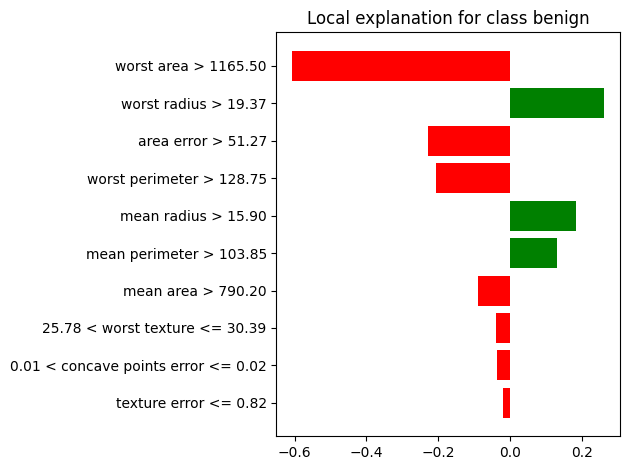

In [38]:
exp = explainer.explain_instance(X_test[1], logreg.predict_proba, num_features=10)
exp.as_pyplot_figure()
plt.tight_layout()


In [39]:
exp.show_in_notebook()


## 4 - Expérimentations

<div class="alert alert-block alert-info">
    Faire des tests pour examiner le comportement de LIME, par exemple pour examiner sa stabilité par rapport à la donné d'intérêt ou par rapport au classifieur, selon un protocole que vous définirez après avoir spécifié l'étude que vous souhaitez mener.
</div>


Nous allons étudier l'instabilité des explications données par LIME pour un même point.


### Stabilité des features indiquées


In [40]:
from tqdm.autonotebook import tqdm

stable_df = pd.DataFrame()

for _ in tqdm(range(1000)):
    explainer = LimeTabularExplainer(
        X_test,
        feature_names=feature_names,
        class_names=target_names,
        categorical_features=[],
        mode="classification",
    )

    exp = explainer.explain_instance(X_test[0], logreg.predict_proba, num_features=10)
    tmp_array = np.array(exp.as_map()[1])
    tmp_df = pd.DataFrame(tmp_array[:, 1], index=tmp_array[:, 0]).T
    stable_df = pd.concat((stable_df, tmp_df))
stable_df


  0%|          | 0/1000 [00:00<?, ?it/s]

,23.0,20.0,22.0,0.0,3.0,21.0,2.0,13.0,7.0,24.0,...,15.0,29.0,8.0,16.0,28.0,6.0,18.0,9.0,12.0,19.0
0,0.258941,-0.087992,0.076881,-0.067960,0.056818,0.052901,-0.049672,0.046599,0.037091,0.035387,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0,0.260855,-0.085705,0.065045,-0.064042,0.031200,0.078986,-0.063836,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0,0.253706,-0.106300,0.078966,-0.047770,0.057254,0.059968,-0.038095,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0,0.279896,-0.090895,0.077120,-0.042411,NaN,0.037093,-0.034617,0.045368,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0,0.240592,-0.089226,0.056086,-0.058509,0.022670,0.065334,-0.076079,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0,0.249187,-0.116466,0.068933,-0.075799,0.032977,0.050176,-0.046351,0.031958,NaN,NaN,...,-0.02204,NaN,NaN,-0.023909,NaN,NaN,NaN,NaN,NaN,NaN
0,0.256852,-0.092578,0.052986,-0.050339,0.056762,0.053989,-0.033432,0.062298,NaN,NaN,...,NaN,NaN,0.023894,NaN,-0.029862,NaN,NaN,NaN,NaN,NaN
0,0.246993,-0.098362,0.062464,-0.071814,NaN,0.047521,-0.024913,NaN,NaN,NaN,...,NaN,NaN,-0.016708,NaN,NaN,NaN,NaN,NaN,-0.015994,NaN
0,0.244938,-0.076604,0.081191,-0.026362,0.044786,0.063372,-0.048139,0.023186,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [41]:
d = {}
for col in stable_df.columns:
    d[col] = stable_df[col].isna().sum()
pd.Series(d).sort_values()


23.0      0
20.0      0
22.0      0
0.0       3
21.0     34
2.0     146
3.0     336
13.0    410
1.0     523
11.0    853
29.0    865
6.0     874
25.0    875
28.0    875
14.0    880
4.0     880
8.0     880
24.0    882
15.0    882
12.0    883
17.0    883
7.0     885
9.0     885
19.0    887
27.0    888
5.0     889
10.0    889
26.0    896
18.0    906
16.0    911
dtype: int64

Nous constatons une stabilité remarquable dans les cinq premiers exemples donnés, car ils étaient présents dans presque tous nos 1000 essais.

Cependant, les features 1 et 13 ont été présentes dans environ 50 % des cas, montrant une fréquence d'apparition plus modérée.

En revanche, pour les autres features, nous observons beaucoup plus de variations, suggérant que la dernière feature est sujette à des variations aléatoires plus importantes.


### Stabilité de la valeur associée à une features


Regardons maintenant si les valeurs associées à ces caractéristiques sont stables.

Dans un premier temps, nous examinerons les caractéristiques "stables" qui se dégagent à chaque explication. Ensuite, nous étudierons celles qui sont plus variables.


#### Chez les features dites "stable"


,23.0,22.0,20.0,3.0,0.0,21.0,2.0
count,1000.000000,1000.000000,1000.000000,664.000000,997.000000,966.000000,854.000000
mean,0.253489,0.079358,-0.095333,0.037478,-0.057420,0.051335,-0.042914
std,0.013895,0.014665,0.014407,0.010446,0.013903,0.013797,0.011913
min,0.210680,0.039368,-0.147941,0.016916,-0.098456,0.018499,-0.086116
25%,0.244475,0.069633,-0.104949,0.029782,-0.066832,0.041089,-0.050639
50%,0.253181,0.079477,-0.095480,0.036230,-0.057311,0.050475,-0.041444
75%,0.263039,0.088794,-0.085975,0.043619,-0.048147,0.060470,-0.033750
max,0.297831,0.129272,-0.046356,0.088518,-0.020286,0.096650,-0.016759


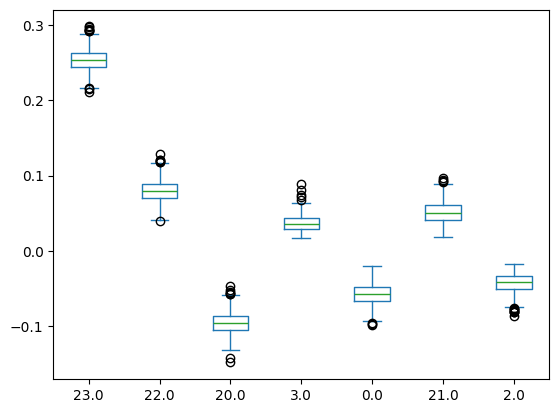

In [42]:
stable_features = [23, 22, 20, 3, 0, 21, 2]
stable_df[stable_features].plot.box()
stable_df[stable_features].describe()


La variance semble assez faible et similaire pour chaque caractéristique mentionnée. On observe parfois quelques valeurs aberrantes, mais rien de significatif sur 1000 exécutions. Il n'y en avait que très peu sur 100 runs.


#### Chez les features dites "instable"


,1.0,13.0,11.0,27.0,24.0,17.0
count,477.000000,590.000000,147.000000,112.000000,118.000000,117.000000
mean,-0.033952,0.035843,-0.017791,-0.000214,0.004080,0.001705
std,0.008657,0.010347,0.024558,0.029525,0.030520,0.028740
min,-0.067328,0.016091,-0.057263,-0.042121,-0.058896,-0.040853
25%,-0.040081,0.027929,-0.033133,-0.027879,-0.026376,-0.025664
50%,-0.032717,0.034165,-0.026884,-0.016969,0.020996,0.020405
75%,-0.027658,0.042028,-0.021190,0.028285,0.030868,0.027452
max,-0.017270,0.072151,0.036725,0.044435,0.050968,0.044964


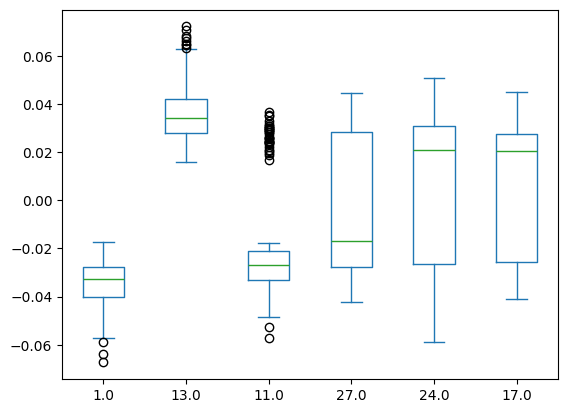

In [43]:
unstable_features = [1.0, 13.0, 11.0, 27.0, 24.0, 17.0]

stable_df[unstable_features].plot.box()
stable_df[unstable_features].describe()


#### Comparaison "stable vs. unstable"


<Axes: >

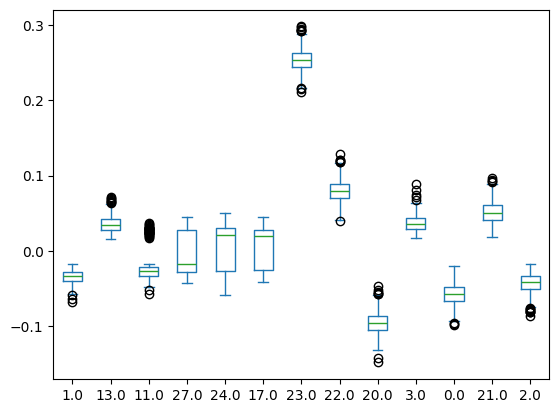

In [44]:
stable_df[unstable_features + stable_features].plot.box()


En revanche, les conclusions sont plutôt inversées pour les features "instables". On observe que la variance est plus élevée dans les classes instables, avec parfois beaucoup d'outliers.


## 5 - Données textuelles

<div class="alert alert-block alert-warning">
    Nous allons apprendre un modèle de classification random forest sur les données <code>fetch_20newsgroups</code> puis utiliser LIME pour obtenir des explications sur la classification d'exemples.
</div>


<div class = "alert alert-block alert-info">
À l'aide de la <a href="https://scikit-learn.org/stable/auto_examples/text/plot_document_classification_20newsgroups.html#sphx-glr-auto-examples-text-plot-document-classification-20newsgroups-py">documentation du dataset fetch_20newsgroups</a>,  apprendre un modèle random forest de classification bi-classe de texte.
</div>


In [45]:
from sklearn.datasets import fetch_20newsgroups
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report

categories = ["sci.space", "sci.crypt"]
newsgroups_train = fetch_20newsgroups(
    subset="train", categories=categories, remove=("headers", "footers", "quotes")
)
newsgroups_test = fetch_20newsgroups(
    subset="test", categories=categories, remove=("headers", "footers", "quotes")
)


In [46]:
import nltk
from nltk.corpus import stopwords

nltk.download("stopwords")


True

On utilise des **stopwords** afin d'éliminer les mots courants (tels que _is_, _this_, etc.) qui risquerait d'introduire du bruit dans l'analyse textuelle et afin d'améliorer notre classifieur.


In [47]:
vectorizer = TfidfVectorizer(lowercase=False, stop_words=stopwords.words("english"))
train_vectors = vectorizer.fit_transform(newsgroups_train.data)
test_vectors = vectorizer.transform(newsgroups_test.data)

rf = RandomForestClassifier(n_estimators=500, random_state=42, n_jobs=-1)
rf.fit(train_vectors, newsgroups_train.target)


RandomForestClassifier(n_estimators=500, n_jobs=-1, random_state=42)

In [48]:
y_pred = rf.predict(test_vectors)
accuracy = accuracy_score(newsgroups_test.target, y_pred)
print(f"Accuracy: {accuracy:.2f}")

report = classification_report(
    newsgroups_test.target, y_pred, target_names=newsgroups_test.target_names
)
print("Classification Report:\n", report)


Accuracy: 0.88
Classification Report:
               precision    recall  f1-score   support

   sci.crypt       0.95      0.80      0.87       396
   sci.space       0.83      0.96      0.89       394

    accuracy                           0.88       790
   macro avg       0.89      0.88      0.88       790
weighted avg       0.89      0.88      0.88       790



[Text(0, 0, 'sci.space'), Text(0, 1, 'sci.crypt')]

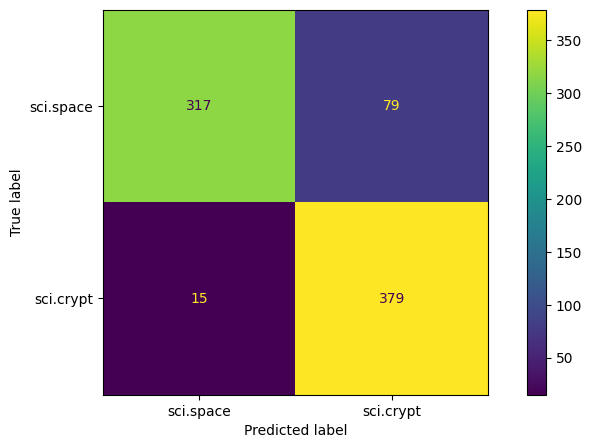

In [49]:
fig, ax = plt.subplots(figsize=(10, 5))
ConfusionMatrixDisplay.from_predictions(newsgroups_test.target, y_pred, ax=ax)
ax.xaxis.set_ticklabels(categories)
ax.yaxis.set_ticklabels(categories)


<div class = "alert alert-block alert-info">
Utilisez LIME pour obtenir des explications sur les prédictions obtenues sur des exemples.
</div>


In [50]:
from lime.lime_text import LimeTextExplainer
from sklearn.pipeline import make_pipeline

c = make_pipeline(vectorizer, rf)
explainer = LimeTextExplainer(class_names=newsgroups_test.target_names)


In [51]:
idx = 69
exp = explainer.explain_instance(
    newsgroups_test.data[idx], c.predict_proba, num_features=6
)
print(f"Document id: {idx}")
print(
    f"Probability(sci.space) = {c.predict_proba([newsgroups_test.data[idx]])[0, 1]:.4f}"
)
print(f"True class: {newsgroups_test.target_names[newsgroups_test.target[idx]]}")


Document id: 69
Probability(sci.space) = 0.2133
True class: sci.crypt


Ici, le classifieur a prédit la bonne classe (`sci.crypt`). L'explication est présentée ci-dessous sous forme d'une liste de caractéristiques pondérées.


In [52]:
exp.as_list()


[('Clipper', -0.12230431148571891),
 ('keys', -0.1117603668673555),
 ('phone', -0.0759584771876488),
 ('warrant', -0.03483045129142451),
 ('The', 0.02798560367627227),
 ('care', -0.02649226003539352)]

Ces caractéristiques pondérées sont un modèle linéaire qui approxime le comportement du classificateur de forêt aléatoire à proximité de l'exemple de test. En gros, si nous supprimons `Clipper` et `keys` du document, la prédiction devrait se déplacer vers la classe opposée (`sci.space`) d'environ 0.23 (la somme des poids pour les deux caractéristiques). Voyons si c'est le cas.


In [53]:
print(f"Original prediction: {rf.predict_proba(test_vectors[idx])[0, 1]:.4f}")
tmp = test_vectors[idx].copy()
tmp[0, vectorizer.vocabulary_["Clipper"]] = 0
tmp[0, vectorizer.vocabulary_["keys"]] = 0
print(f"Prediction removing some features: {rf.predict_proba(tmp)[0, 1]:.4f}")
print(
    f"Difference: {rf.predict_proba(tmp)[0, 1] - rf.predict_proba(test_vectors[idx])[0, 1]:.4f}"
)


Original prediction: 0.2133
Prediction removing some features: 0.3948
Difference: 0.1814


In [54]:
exp.show_in_notebook()


In [55]:
idx = 77
exp = explainer.explain_instance(
    newsgroups_test.data[idx], c.predict_proba, num_features=6
)
print(f"Document id: {idx}")
print(f"Probability(sci.crypt) = {c.predict_proba([newsgroups_test.data[idx]])[0, 1]}")
print(f"True class: {categories[newsgroups_test.target[idx]]}")
exp.show_in_notebook()


Document id: 77
Probability(sci.crypt) = 0.525617696247463
True class: sci.crypt


## 6 - Implémentation de LIME

<div class="alert alert-block alert-info">
    Sur des données textuelles, implémentez une version rudimentaire de LIME en utilisant la fonction de proximité proposée dans le cours. Retrouvez-vous les mêmes vecteurs d'importance qu'avec la bibliothèque LIME ?
</div>


In [56]:
from copy import copy
from sklearn.linear_model import Ridge


# Nom des fonctions issus de la notation du cours
class CustomLimeTextExplainer:
    def __init__(self, class_names, vectorizer, card_Z=10000):
        self.class_names = class_names
        self.vectorizer = vectorizer  # afin de transformer le corpus
        self.card_Z = card_Z

    def generate_z(self, text_instance):
        modified_text_instances = []
        weights = []
        splited_text = text_instance.split(" ")
        nb_mot = len(splited_text)
        sigma = int(
            0.75 * np.sqrt(nb_mot)
        )  # on change maximum sigma nombre de mots dans la phrase
        for _ in range(self.card_Z):
            splited_text_tmp = copy(splited_text)
            nb_word_to_change = np.random.randint(0, sigma)
            index_to_remove = np.random.randint(0, nb_mot, size=nb_word_to_change)
            for i in index_to_remove:
                splited_text_tmp[i] = ""
            modified_text_instances.append(" ".join(splited_text_tmp))
            weights.append(1 - nb_word_to_change / nb_mot)
        return modified_text_instances, weights

    def explain_instance(self, text_instance, classifier_fn, num_features=None):
        modified_text_instances, weights = self.generate_z(text_instance)
        prob = classifier_fn(modified_text_instances).max(1)
        clf = Ridge(fit_intercept=True)
        clf.fit(
            self.vectorizer.transform(modified_text_instances),
            prob,
            sample_weight=weights,
        )
        return pd.Series(clf.coef_, index=vectorizer.get_feature_names_out())


explainer = CustomLimeTextExplainer(
    class_names=newsgroups_test.target_names, vectorizer=vectorizer
)
coef = explainer.explain_instance(
    newsgroups_test.data[idx], c.predict_proba, num_features=6
)


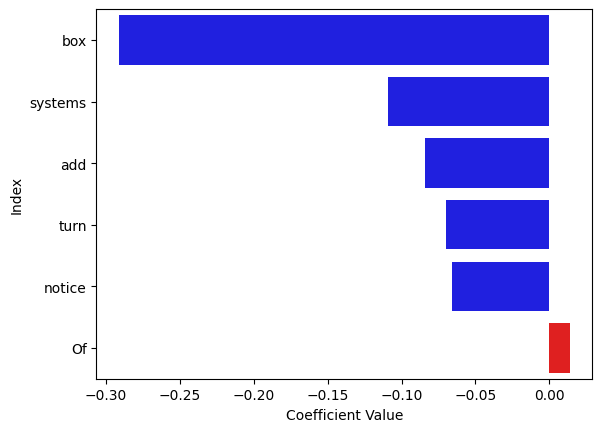

In [57]:
import seaborn as sns

top5 = coef.sort_values()[:5]
less5 = coef.sort_values(ascending=False)[:5]

to_plot = pd.DataFrame(pd.concat((top5[top5 != 0], less5[less5 != 0]))).reset_index()
to_plot["class"] = ["top"] * len(top5[top5 != 0]) + ["less"] * len(less5[less5 != 0])

colors = ["blue" if c == "top" else "red" for c in to_plot["class"]]

sns.barplot(data=to_plot, x=0, y="index", palette=colors)
plt.xlabel("Coefficient Value")
plt.ylabel("Index")
plt.show()


On retrouve les résultats précédents !
